# Seasonal decomposition

Libraries and functions

In [1]:
import sys
import os
sys.path.append(os.path.abspath("..")) 

import pandas as pd
from datetime import datetime
import plotly_express as px

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

from functions_laura.Data_processing import resample

Data import

In [2]:
df = pd.read_parquet('../data/hamburg_23-25-brands.parquet')

In [7]:
df = pd.read_parquet('../data/hamburg_23-25-brands.parquet')
df['datetime'] = df['date'].apply(lambda x: datetime.strptime(x.split("+")[0], "%Y-%m-%d %H:%M:%S"))


***

In [ ]:
def add_seasonal(resampled, fuel='e5', period=288):
    '''
    Creates a dataframe containing the original dataframe with the seasonal pattern extracted by seasonal decomposition

    Args:
        resampled (pd.DataFrame): Resampled dataframe (contains: 'datetime' and a fuel column (default: 'e5'))
        fuel (str, optional): Fuel Type: 'e5', 'e10' or 'diesel'. Defaults to 'e5'.
        period (int, optional): Periodicity of the seasonal decomposition. Defaults to 288 (equals 1 day).

    Returns:
        pd.DataFrame: df with seasonal pattern
    '''
    decompose = seasonal_decompose(resampled[fuel], model='additive', period = period)
    seasonal_df = decompose.seasonal.reset_index()

    df = pd.DataFrame({
        'datetime': resampled['datetime'],
        'seasonal_component': seasonal_df['seasonal'],
        'e5' : resampled[fuel]
    })

    return df

In [10]:
resampled = resample(df)

In [13]:
resampled = resampled.reset_index() 

In [14]:
decompose = seasonal_decompose(resampled['e5'], model='additive', period = 288)
seasonal_df = decompose.seasonal.reset_index()

In [16]:
df = pd.DataFrame({
        'datetime': resampled['datetime'],
        'seasonal_component': seasonal_df['seasonal'],
        'e5' : resampled['e5']
})

***

In [8]:
resampled = resample(df)

In [ ]:
# we plot the price during time
plot = px.line(resampled, x="datetime", y="e5", title="Average E5 Price in Hamburg Over Time")
plot.update_layout(
    title_font_size=20,
    xaxis_title="Time",
    yaxis_title="Average price (€/L)",
    width=1500,
    height=800,
    margin=dict(l=40, r=40, t=60, b=40),
    template="plotly_white"
)
plot.show()

We look at the pattern using partial autocorrelation

<Figure size 1200x600 with 0 Axes>

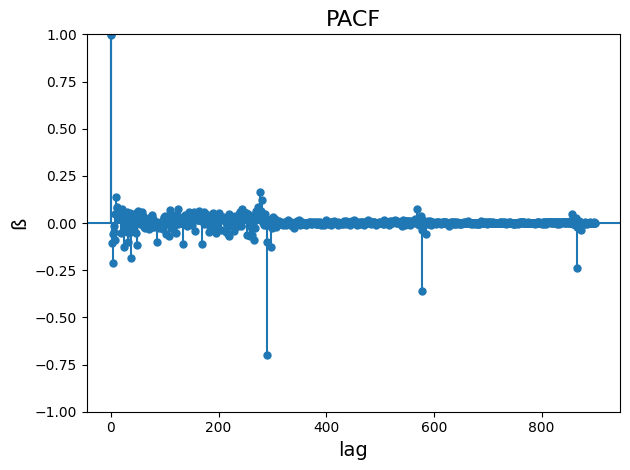

In [10]:
plt.figure(figsize=(12, 6))

pacf_plot = plot_pacf(resampled['e5'],lags = 900)

plt.title("PACF", fontsize = 16)
plt.xlabel("lag", fontsize = 14)
plt.ylabel("ß", fontsize = 14)

plt.tight_layout()
plt.show()  # Add this to ensure plot displays

We find a high autocorrelation at 288, which is one day (24h / 5min = 288)

In [ ]:
resampled = resampled.set_index('datetime')

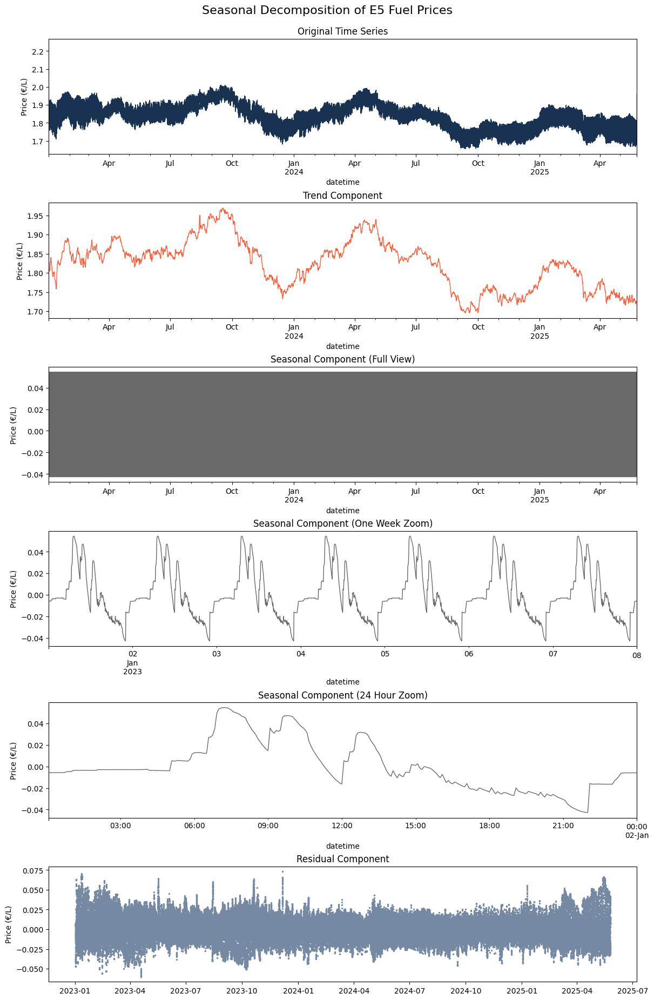

In [ ]:
# Define colors for consistent styling
colors = ['#193251','#FF5A36','#696969', '#7589A2']

decompose = seasonal_decompose(resampled['e5'], model='additive', period = 288 ) # period = 288 is a day
# Create subplot layout with 6 rows
fig, ax = plt.subplots(6, 1, figsize=(12, 18), constrained_layout=True)

# Plot Signal
ax[0].set(title='Original Time Series', ylabel='Price (€/L)')
decompose.observed.plot(color=colors[0], linewidth=1, ax=ax[0])

# Plot Trend
ax[1].set(title='Trend Component', ylabel='Price (€/L)')
decompose.trend.plot(color=colors[1], linewidth=1, ax=ax[1])

# Plot Full Seasonality
ax[2].set(title='Seasonal Component (Full View)', ylabel='Price (€/L)')
decompose.seasonal.plot(color=colors[2], linewidth=1, ax=ax[2])

# Plot Week Zoom
ax[3].set(title='Seasonal Component (One Week Zoom)', ylabel='Price (€/L)')
week_zoom = decompose.seasonal.iloc[:288*7]  # One week of data
week_zoom.plot(color=colors[2], linewidth=1, ax=ax[3])

# Plot Day Zoom
ax[4].set(title='Seasonal Component (24 Hour Zoom)', ylabel='Price (€/L)')
day_zoom = decompose.seasonal.iloc[:288]  # One day of data (288 5-minute intervals)
day_zoom.plot(color=colors[2], linewidth=1, ax=ax[4])

# Plot Residual
ax[5].set(title='Residual Component', ylabel='Price (€/L)')
ax[5].scatter(decompose.resid.index, decompose.resid, color=colors[3], s=2)

# for i in range(4):
#     ax[i].set_xlim(pd.to_datetime("2023"),pd.to_datetime("2026"))
        
# Add main title
plt.suptitle('Seasonal Decomposition of E5 Fuel Prices', fontsize=16, y=1.02)
plt.show()



Create a dataframe from the seasonal component

In [ ]:
# Get seasonal pattern and reset index
daily_pattern = decompose.seasonal.reset_index()

# Convert datetime to time of day
daily_pattern['time_of_day'] = daily_pattern['datetime'].dt.time

# Create final dataframe with time and seasonal component
daily_df = pd.DataFrame({
    'time': daily_pattern['time_of_day'],
    'seasonal_component': daily_pattern['seasonal']
})

Now we concatenate the daily pattern on to the original dataframe

In [ ]:
# First reset index to get datetime as a column
resampled_temp = resampled.reset_index()

# Extract time of day from datetime
resampled_temp['time_of_day'] = resampled_temp['datetime'].dt.time

# Now merge with daily pattern on time
resampled_season = resampled_temp.merge(daily_df, 
                              left_on='time_of_day', 
                              right_on='time', 
                              how='left')

resampled_season = pd.DataFrame({
    'datetime': resampled_season['datetime'],
    'seasonal_component': resampled_season['seasonal_component'],
    'e5' : resampled_season['e5']
})

# Functions testing

In [2]:
# import my functions
from functions_laura.Data_processing import resample
from functions_laura.Data_processing import add_seasonal
from functions_laura.Data_processing import resample_with_seasonality
from functions_laura.Plotting import decompose_and_plot

In [3]:
# import data
df = pd.read_parquet('../data/hamburg_23-25-brands.parquet')

read data = 2 sec

In [4]:
resampled_func = resample(df)
resampled_func.head()

,datetime,e5
1,2023-01-01 00:05:00,2.239
2,2023-01-01 00:10:00,2.239
3,2023-01-01 00:15:00,2.239
4,2023-01-01 00:20:00,2.239
5,2023-01-01 00:25:00,2.239


resample function = 21.3 sec

In [5]:
resampled_seasonal = add_seasonal(resampled_func)
resampled_seasonal.head()

,datetime,seasonal_component,e5
1,2023-01-01 00:05:00,-0.005821,2.239
2,2023-01-01 00:10:00,-0.005821,2.239
3,2023-01-01 00:15:00,-0.005818,2.239
4,2023-01-01 00:20:00,-0.005813,2.239
5,2023-01-01 00:25:00,-0.005805,2.239


add seasonal = 56 sec

In [4]:
resampled_seasonal_full = resample_with_seasonality(df)
resampled_seasonal_full

,datetime,seasonal_component,e5
1,2023-01-01 00:05:00,-0.005821,2.239000
2,2023-01-01 00:10:00,-0.005821,2.239000
3,2023-01-01 00:15:00,-0.005818,2.239000
4,2023-01-01 00:20:00,-0.005813,2.239000
5,2023-01-01 00:25:00,-0.005805,2.239000
...,...,...,...
252276,2025-05-25 23:00:00,-0.013495,1.688057
252277,2025-05-25 23:05:00,-0.011791,1.673865
252278,2025-05-25 23:10:00,-0.009646,1.675389
252279,2025-05-25 23:15:00,-0.006839,1.683091


resample_with_seasonality = 1m 16.2 sec

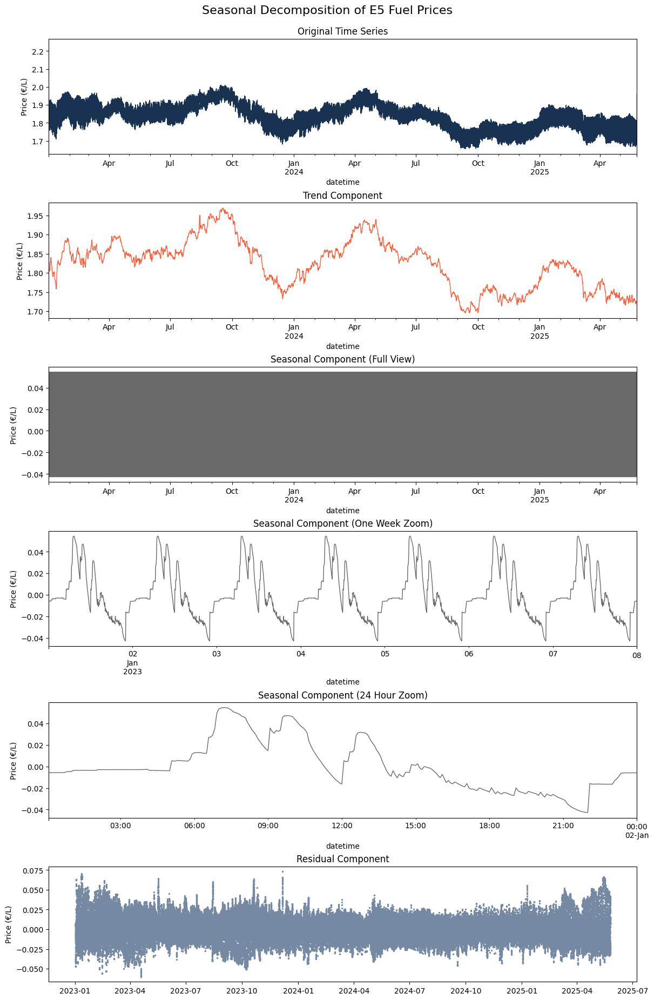

In [4]:
decompose_and_plot(df)

decompose_and_plot = 25 sec